# Library

In [1]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
from keras.callbacks import EarlyStopping, ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix, classification_report
import os
import csv


In [2]:
path_train="D:\\my work\\my work\\CNN\\Emotion Faces\\train"
path_test="D:\my work\my work\CNN\Emotion Faces\\test"
path_val="D:\my work\my work\CNN\Emotion Faces\\val"

<>:2: SyntaxWarning: invalid escape sequence '\m'
<>:3: SyntaxWarning: invalid escape sequence '\m'
<>:2: SyntaxWarning: invalid escape sequence '\m'
<>:3: SyntaxWarning: invalid escape sequence '\m'
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_28184\1938760606.py:2: SyntaxWarning: invalid escape sequence '\m'
  path_test="D:\my work\my work\CNN\Emotion Faces\\test"
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_28184\1938760606.py:3: SyntaxWarning: invalid escape sequence '\m'
  path_val="D:\my work\my work\CNN\Emotion Faces\\val"


# data preprossecing 
get the data raedy for cnn model

## see if the data have a duplicate image 

In [13]:

from imagededup.methods import PHash
import os
import shutil

base_folder_path = "D:\\my work\\my work\\CNN\\Emotion Faces"
destination_folder = r'D:\my work\my work\CNN\duplicate'

main_folders = ['train','test']
subfolders = ['angry', 'disgusted', 'fearful', 'happy', 'neutral', 'sad', 'surprised']

for main_folder in main_folders:
    main_folder_path = os.path.join(base_folder_path, main_folder)

    for subfolder in subfolders:
        subfolder_path = os.path.join(main_folder_path, subfolder)

        if os.path.exists(subfolder_path):
            image_files = [f for f in os.listdir(subfolder_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
            current_count = len(image_files)
            phasher = PHash()
            duplicates = phasher.find_duplicates(image_dir=subfolder_path, scores=True)
            # Calculate the number of unique images with duplicates
            num_duplicates = sum(len(duplicate_list) for duplicate_list in duplicates.values() if duplicate_list)
            print(f'Number of images with duplicates: {num_duplicates} on {subfolder_path}')

            # Optionally, to see the total number of duplicate pairs (including repetitions)
            duplicate_pairs_count = sum(len(duplicate_list) for duplicate_list in duplicates.values())
            print(f'Total number of duplicate pairs found: {duplicate_pairs_count}')
            for image, dup_list in duplicates.items():
                for duplicate_image in dup_list:
                     duplicate_image_path = os.path.join(subfolder_path, str(duplicate_image))
                     if os.path.exists(duplicate_image_path):
                         shutil.move(duplicate_image_path,destination_folder)
                         print(f"Moved {duplicate_image} to {destination_folder}")

            



    

2024-10-15 14:17:50,332: INFO Start: Calculating hashes...
100%|██████████| 3995/3995 [00:11<00:00, 348.28it/s]
2024-10-15 14:18:03,247: INFO End: Calculating hashes!
2024-10-15 14:18:03,248: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:18:03,249: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 3995/3995 [00:32<00:00, 124.35it/s]
2024-10-15 14:18:36,900: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:18:36,902: INFO End: Evaluating hamming distances for getting duplicates
2024-10-15 14:18:37,021: INFO Start: Calculating hashes...


Number of images with duplicates: 1846 on D:\my work\my work\CNN\Emotion Faces\train\angry
Total number of duplicate pairs found: 1846


100%|██████████| 436/436 [00:05<00:00, 78.98it/s]
2024-10-15 14:18:43,268: INFO End: Calculating hashes!
2024-10-15 14:18:43,269: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:18:43,270: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 436/436 [00:05<00:00, 77.36it/s]
2024-10-15 14:18:49,625: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:18:49,626: INFO End: Evaluating hamming distances for getting duplicates


Number of images with duplicates: 466 on D:\my work\my work\CNN\Emotion Faces\train\disgusted
Total number of duplicate pairs found: 466


2024-10-15 14:18:49,846: INFO Start: Calculating hashes...
100%|██████████| 4097/4097 [00:12<00:00, 341.28it/s]
2024-10-15 14:19:03,359: INFO End: Calculating hashes!
2024-10-15 14:19:03,363: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:19:03,364: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 4097/4097 [00:34<00:00, 118.70it/s]
2024-10-15 14:19:39,426: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:19:39,428: INFO End: Evaluating hamming distances for getting duplicates


Number of images with duplicates: 2350 on D:\my work\my work\CNN\Emotion Faces\train\fearful
Total number of duplicate pairs found: 2350


2024-10-15 14:19:39,910: INFO Start: Calculating hashes...
100%|██████████| 7215/7215 [00:12<00:00, 596.38it/s] 
2024-10-15 14:19:53,590: INFO End: Calculating hashes!
2024-10-15 14:19:53,592: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:19:53,592: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 7215/7215 [01:21<00:00, 88.72it/s] 
2024-10-15 14:21:16,737: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:21:16,739: INFO End: Evaluating hamming distances for getting duplicates


Number of images with duplicates: 3072 on D:\my work\my work\CNN\Emotion Faces\train\happy
Total number of duplicate pairs found: 3072


2024-10-15 14:21:17,252: INFO Start: Calculating hashes...
100%|██████████| 4965/4965 [00:11<00:00, 417.18it/s] 
2024-10-15 14:21:30,745: INFO End: Calculating hashes!
2024-10-15 14:21:30,746: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:21:30,746: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 4965/4965 [00:46<00:00, 105.74it/s]
2024-10-15 14:22:19,252: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:22:19,255: INFO End: Evaluating hamming distances for getting duplicates


Number of images with duplicates: 1514 on D:\my work\my work\CNN\Emotion Faces\train\neutral
Total number of duplicate pairs found: 1514


2024-10-15 14:22:19,601: INFO Start: Calculating hashes...
100%|██████████| 4830/4830 [00:11<00:00, 406.56it/s]
2024-10-15 14:22:32,892: INFO End: Calculating hashes!
2024-10-15 14:22:32,893: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:22:32,894: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 4830/4830 [00:49<00:00, 98.44it/s] 
2024-10-15 14:23:23,558: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:23:23,571: INFO End: Evaluating hamming distances for getting duplicates


Number of images with duplicates: 1444 on D:\my work\my work\CNN\Emotion Faces\train\sad
Total number of duplicate pairs found: 1444


2024-10-15 14:23:23,860: INFO Start: Calculating hashes...
100%|██████████| 3171/3171 [00:11<00:00, 268.86it/s]
2024-10-15 14:23:37,004: INFO End: Calculating hashes!
2024-10-15 14:23:37,005: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:23:37,006: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 3171/3171 [00:23<00:00, 134.28it/s]
2024-10-15 14:24:02,184: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:24:02,185: INFO End: Evaluating hamming distances for getting duplicates
2024-10-15 14:24:02,365: INFO Start: Calculating hashes...


Number of images with duplicates: 2828 on D:\my work\my work\CNN\Emotion Faces\train\surprised
Total number of duplicate pairs found: 2828


100%|██████████| 958/958 [00:08<00:00, 111.03it/s]
2024-10-15 14:24:12,033: INFO End: Calculating hashes!
2024-10-15 14:24:12,034: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:24:12,035: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 958/958 [00:14<00:00, 66.97it/s]
2024-10-15 14:24:28,882: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:24:28,883: INFO End: Evaluating hamming distances for getting duplicates
2024-10-15 14:24:28,906: INFO Start: Calculating hashes...


Number of images with duplicates: 94 on D:\my work\my work\CNN\Emotion Faces\test\angry
Total number of duplicate pairs found: 94


100%|██████████| 111/111 [00:05<00:00, 21.35it/s]
2024-10-15 14:24:34,827: INFO End: Calculating hashes!
2024-10-15 14:24:34,829: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:24:34,830: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 111/111 [00:05<00:00, 21.22it/s]
2024-10-15 14:24:40,646: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:24:40,647: INFO End: Evaluating hamming distances for getting duplicates
2024-10-15 14:24:40,695: INFO Start: Calculating hashes...


Number of images with duplicates: 14 on D:\my work\my work\CNN\Emotion Faces\test\disgusted
Total number of duplicate pairs found: 14


100%|██████████| 1024/1024 [00:10<00:00, 98.46it/s]
2024-10-15 14:24:53,956: INFO End: Calculating hashes!
2024-10-15 14:24:53,957: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:24:53,957: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 1024/1024 [00:10<00:00, 97.26it/s]
2024-10-15 14:25:05,615: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:25:05,616: INFO End: Evaluating hamming distances for getting duplicates
2024-10-15 14:25:05,718: INFO Start: Calculating hashes...


Number of images with duplicates: 134 on D:\my work\my work\CNN\Emotion Faces\test\fearful
Total number of duplicate pairs found: 134


100%|██████████| 1774/1774 [00:11<00:00, 153.96it/s]
2024-10-15 14:25:18,678: INFO End: Calculating hashes!
2024-10-15 14:25:18,679: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:25:18,680: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 1774/1774 [00:17<00:00, 101.06it/s]
2024-10-15 14:25:37,674: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:25:37,675: INFO End: Evaluating hamming distances for getting duplicates


Number of images with duplicates: 200 on D:\my work\my work\CNN\Emotion Faces\test\happy
Total number of duplicate pairs found: 200


2024-10-15 14:25:37,972: INFO Start: Calculating hashes...
100%|██████████| 1233/1233 [00:09<00:00, 124.49it/s]
2024-10-15 14:25:49,059: INFO End: Calculating hashes!
2024-10-15 14:25:49,061: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:25:49,062: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 1233/1233 [00:12<00:00, 101.93it/s]
2024-10-15 14:26:02,365: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:26:02,367: INFO End: Evaluating hamming distances for getting duplicates
2024-10-15 14:26:02,442: INFO Start: Calculating hashes...


Number of images with duplicates: 98 on D:\my work\my work\CNN\Emotion Faces\test\neutral
Total number of duplicate pairs found: 98


100%|██████████| 1247/1247 [00:09<00:00, 128.63it/s]
2024-10-15 14:26:13,340: INFO End: Calculating hashes!
2024-10-15 14:26:13,341: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:26:13,341: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 1247/1247 [00:12<00:00, 97.48it/s]
2024-10-15 14:26:27,423: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:26:27,424: INFO End: Evaluating hamming distances for getting duplicates
2024-10-15 14:26:27,492: INFO Start: Calculating hashes...


Number of images with duplicates: 82 on D:\my work\my work\CNN\Emotion Faces\test\sad
Total number of duplicate pairs found: 82


100%|██████████| 831/831 [00:07<00:00, 106.91it/s]
2024-10-15 14:26:36,218: INFO End: Calculating hashes!
2024-10-15 14:26:36,219: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:26:36,219: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 831/831 [00:08<00:00, 95.51it/s]
2024-10-15 14:26:45,891: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:26:45,891: INFO End: Evaluating hamming distances for getting duplicates


Number of images with duplicates: 214 on D:\my work\my work\CNN\Emotion Faces\test\surprised
Total number of duplicate pairs found: 214


## moving the duplicate image into anther folder 

In [1]:
from imagededup.methods import PHash
import os
import shutil

base_folder_path = "D:\\my work\\my work\\CNN\\Emotion Faces"
destination_folder = r'D:\my work\my work\CNN\duplicate'

main_folders = ['train', 'test']
subfolders = ['angry', 'disgusted', 'fearful', 'happy', 'neutral', 'sad', 'surprised']

# Ensure the base destination folder exists
if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)

for main_folder in main_folders:
    main_folder_path = os.path.join(base_folder_path, main_folder)

    for subfolder in subfolders:
        subfolder_path = os.path.join(main_folder_path, subfolder)

        if os.path.exists(subfolder_path):
            image_files = [f for f in os.listdir(subfolder_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
            phasher = PHash()
            
            # Find duplicates with scores
            duplicates = phasher.find_duplicates(image_dir=subfolder_path, scores=True)

            # Move duplicate images to individual folders under the destination
            for original_image, dup_list in duplicates.items():
                # Define path for original image's duplicate folder
                original_image_name = os.path.splitext(original_image)[0]
                duplicate_subfolder = os.path.join(destination_folder, original_image_name)
                
                # Create subfolder for the duplicates of the original image
                if not os.path.exists(duplicate_subfolder):
                    os.makedirs(duplicate_subfolder)

                # Move duplicates of the original image into its corresponding subfolder
                for duplicate_image, _ in dup_list:
                    duplicate_image_path = os.path.join(subfolder_path, str(duplicate_image))
                    if os.path.exists(duplicate_image_path):
                        shutil.move(duplicate_image_path, duplicate_subfolder)
                        print(f"Moved {duplicate_image} to {duplicate_subfolder}")


2024-10-15 14:50:06,335: INFO Start: Calculating hashes...
100%|██████████| 3220/3220 [00:13<00:00, 233.98it/s]
2024-10-15 14:50:21,665: INFO End: Calculating hashes!
2024-10-15 14:50:21,667: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:50:21,668: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 3220/3220 [00:31<00:00, 103.72it/s]
2024-10-15 14:50:54,271: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:50:54,272: INFO End: Evaluating hamming distances for getting duplicates
2024-10-15 14:50:55,103: INFO Start: Calculating hashes...
100%|██████████| 236/236 [00:06<00:00, 38.44it/s]
2024-10-15 14:51:02,021: INFO End: Calculating hashes!
2024-10-15 14:51:02,023: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:51:02,024: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 236/236 [00:05<00:00, 42.22it/s]
2024-10-15 14:51:08,321: INFO End: Retrieving duplicates 

Moved im169.png to D:\my work\my work\CNN\duplicate\im133
Moved im804.png to D:\my work\my work\CNN\duplicate\im138
Moved im754.png to D:\my work\my work\CNN\duplicate\im140
Moved im838.png to D:\my work\my work\CNN\duplicate\im144
Moved im133.png to D:\my work\my work\CNN\duplicate\im169
Moved im564.png to D:\my work\my work\CNN\duplicate\im177
Moved im447.png to D:\my work\my work\CNN\duplicate\im180
Moved im470.png to D:\my work\my work\CNN\duplicate\im200
Moved im385.png to D:\my work\my work\CNN\duplicate\im216
Moved im292.png to D:\my work\my work\CNN\duplicate\im231
Moved im231.png to D:\my work\my work\CNN\duplicate\im292
Moved im772.png to D:\my work\my work\CNN\duplicate\im292
Moved im520.png to D:\my work\my work\CNN\duplicate\im33
Moved im418.png to D:\my work\my work\CNN\duplicate\im340
Moved im854.png to D:\my work\my work\CNN\duplicate\im349
Moved im216.png to D:\my work\my work\CNN\duplicate\im385
Moved im979.png to D:\my work\my work\CNN\duplicate\im386
Moved im398.png

100%|██████████| 831/831 [00:08<00:00, 95.68it/s]
2024-10-15 14:57:46,738: INFO End: Calculating hashes!
2024-10-15 14:57:46,739: INFO Start: Evaluating hamming distances for getting duplicates
2024-10-15 14:57:46,739: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 831/831 [00:08<00:00, 94.01it/s]
2024-10-15 14:57:56,568: INFO End: Retrieving duplicates using BKTree algorithm
2024-10-15 14:57:56,569: INFO End: Evaluating hamming distances for getting duplicates


Moved im339.png to D:\my work\my work\CNN\duplicate\im1
Moved im377.png to D:\my work\my work\CNN\duplicate\im10
Moved im401.png to D:\my work\my work\CNN\duplicate\im108
Moved im417.png to D:\my work\my work\CNN\duplicate\im11
Moved im173.png to D:\my work\my work\CNN\duplicate\im113
Moved im166.png to D:\my work\my work\CNN\duplicate\im114
Moved im398.png to D:\my work\my work\CNN\duplicate\im115
Moved im279.png to D:\my work\my work\CNN\duplicate\im116
Moved im826.png to D:\my work\my work\CNN\duplicate\im116
Moved im196.png to D:\my work\my work\CNN\duplicate\im123
Moved im227.png to D:\my work\my work\CNN\duplicate\im126
Moved im486.png to D:\my work\my work\CNN\duplicate\im128
Moved im807.png to D:\my work\my work\CNN\duplicate\im129
Moved im692.png to D:\my work\my work\CNN\duplicate\im129
Moved im357.png to D:\my work\my work\CNN\duplicate\im130
Moved im253.png to D:\my work\my work\CNN\duplicate\im130
Moved im373.png to D:\my work\my work\CNN\duplicate\im135
Moved im456.png to

# crate a val folcer for validaiton procces


In [2]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Paths to your train and val directories
train_dir = 'D:\\my work\\my work\\CNN\\Emotion Faces\\train'
val_dir = 'D:\\my work\\my work\\CNN\\Emotion Faces\\val'

# Create the validation directory structure
os.makedirs(val_dir, exist_ok=True)

# Loop through each class folder in the training directory
for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name)

    # Skip if not a directory (in case there are any files in the root train directory)
    if not os.path.isdir(class_path):
        continue

    # Create the corresponding class directory in the val folder
    os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)

    # List all images in the class directory
    images = os.listdir(class_path)

    # Split the images into training and validation sets
    train_images, val_images = train_test_split(images, test_size=0.25, random_state=0)

    # Move validation images to the new val directory
    for img in val_images:
        src_path = os.path.join(class_path, img)
        dst_path = os.path.join(val_dir, class_name, img)
        shutil.move(src_path, dst_path)

print("Validation data has been moved to the 'val' directory.")


Validation data has been moved to the 'val' directory.


# rebalancing the number if image on the categoris for train test and val 

In [3]:
from PIL import Image
import os
import random

# Base input directory
base_folder_path = "D:\\my work\\my work\\CNN\\Emotion Faces"

# List of angles to rotate each image
angles = [45, 90, 180, 270]  # Add more angles or other augmentations as needed

# Main folder and subfolder names
main_folders = ['train']
subfolders = ['angry', 'disgusted', 'fearful', 'happy', 'neutral', 'sad', 'surprised']

# Set a target number of images per class
target_count = 4500  # Adjust based on your needs

# Iterate through each main folder
for main_folder in main_folders:
    main_folder_path = os.path.join(base_folder_path, main_folder)
    
    # Iterate through each subfolder
    for subfolder in subfolders:
        subfolder_path = os.path.join(main_folder_path, subfolder)
        
        # Check if the subfolder exists
        if os.path.exists(subfolder_path):
            image_files = [f for f in os.listdir(subfolder_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
            current_count = len(image_files)
            
            # Calculate number of images needed to reach the target count
            images_needed = target_count - current_count
            img_index = 0
            
            # Check if augmentation is needed
            if images_needed > 0:
                while images_needed > 0:
                    # Loop through images in a cycle
                    filename = image_files[img_index % len(image_files)]
                    img_index += 1
                    
                    img_path = os.path.join(subfolder_path, filename)
                    img = Image.open(img_path)
                    
                    # Randomly choose an angle for rotation
                    angle = random.choice(angles)
                    rotated_img = img.rotate(angle)
                    
                    # Save in the same folder as the original
                    rotated_filename = f"{os.path.splitext(filename)[0]}_aug{images_needed}{os.path.splitext(filename)[1]}"
                    rotated_img.save(os.path.join(subfolder_path, rotated_filename))
                    
                    images_needed -= 1

print("Dataset has been rebalanced and augmented successfully!")


Dataset has been rebalanced and augmented successfully!


In [4]:
from PIL import Image
import os
import random

# Base input directory
base_folder_path = "D:\\my work\\my work\\CNN\\Emotion Faces"

# List of angles to rotate each image
angles = [0,45, 90, 180, 270]  # Add more angles or other augmentations as needed

# Main folder and subfolder names
main_folders = ['test','val']
subfolders = ['angry', 'disgusted', 'fearful', 'happy', 'neutral', 'sad', 'surprised']

# Set a target number of images per class
target_count = 2000  # Adjust based on your needs

# Iterate through each main folder
for main_folder in main_folders:
    main_folder_path = os.path.join(base_folder_path, main_folder)
    
    # Iterate through each subfolder
    for subfolder in subfolders:
        subfolder_path = os.path.join(main_folder_path, subfolder)
        
        # Check if the subfolder exists
        if os.path.exists(subfolder_path):
            image_files = [f for f in os.listdir(subfolder_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
            current_count = len(image_files)
            
            # Calculate number of images needed to reach the target count
            images_needed = target_count - current_count
            img_index = 0
            
            # Check if augmentation is needed
            if images_needed > 0:
                while images_needed > 0:
                    # Loop through images in a cycle
                    filename = image_files[img_index % len(image_files)]
                    img_index += 1
                    
                    img_path = os.path.join(subfolder_path, filename)
                    img = Image.open(img_path)
                    
                    # Randomly choose an angle for rotation
                    angle = random.choice(angles)
                    rotated_img = img.rotate(angle)
                    
                    # Save in the same folder as the original
                    rotated_filename = f"{os.path.splitext(filename)[0]}_aug{images_needed}{os.path.splitext(filename)[1]}"
                    rotated_img.save(os.path.join(subfolder_path, rotated_filename))
                    
                    images_needed -= 1

print("Dataset has been rebalanced and augmented successfully!")


Dataset has been rebalanced and augmented successfully!


## on this plot will see that the class are to close to anather so to so hard to classife 

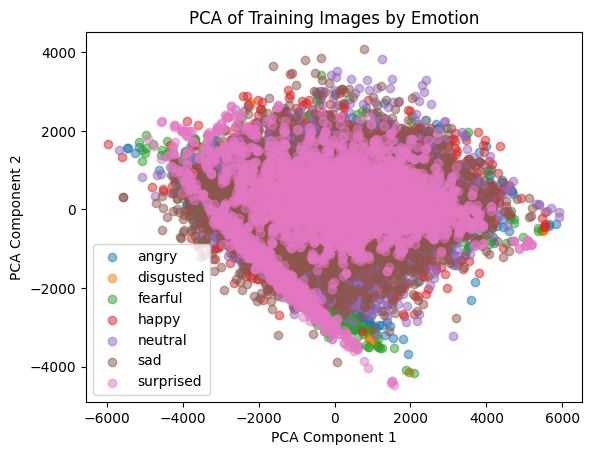

In [37]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Define the base folder and subfolders
base_folder_path = "D:\\my work\\my work\\CNN\\Emotion Faces"
train_dir = os.path.join(base_folder_path, "train")
subfolders = ['angry', 'disgusted', 'fearful', 'happy', 'neutral', 'sad', 'surprised']
#subfolders = ['angry_cluster_1', 'angry_cluster_2', 'disgusted_cluster_1', 'disgusted_cluster_2', 'fearful_cluster_1', 'fearful_cluster_2', 'happy_cluster_1','happy_cluster_2',
#              'neutral_cluster_1','neutral_cluster_2','sad_cluster_1','sad_cluster_2','surprised_cluster_1','surprised_cluster_2']

def apply_pca(image_dir, num_components=50):
    image_data = []
    
    for filename in os.listdir(image_dir):
        img_path = os.path.join(image_dir, filename)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            image_data.append(img.flatten())  # Flatten 2D image to 1D array
    
    if not image_data:  # Check if any images were loaded
        return None

    image_data = np.array(image_data)
    pca = PCA(n_components=num_components)
    pca_result = pca.fit_transform(image_data)
    
    return pca_result

# Apply PCA to the training data for each subfolder
for subfolder in subfolders:
    subfolder_path = os.path.join(train_dir, subfolder)
    
    # Check if subfolder exists
    if os.path.exists(subfolder_path):
        pca_result = apply_pca(subfolder_path, num_components=2)
        
        # Scatter plot of PCA result
        if pca_result is not None:
            plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.5, label=subfolder)
        else:
            print(f"No images found in '{subfolder}' subfolder.")

# Customize plot
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA of Training Images by Emotion')
plt.legend()
plt.show()


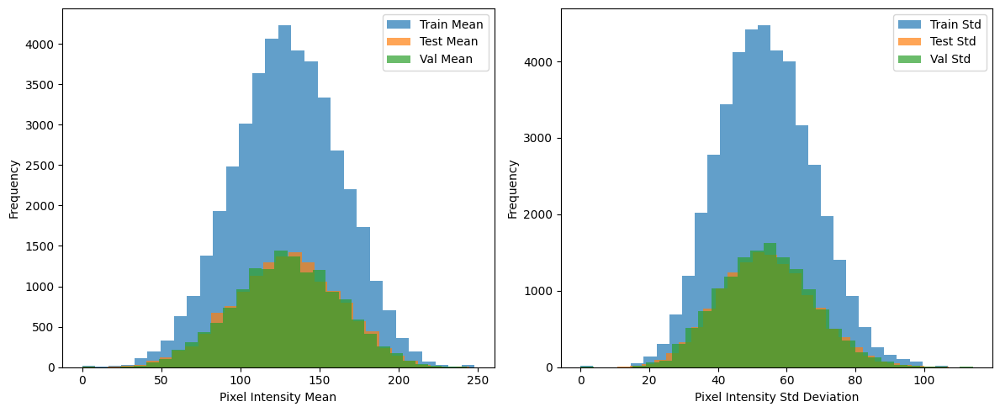

In [12]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Paths and folder structure
base_folder_path = "D:\\my work\\my work\\CNN\\Emotion Faces"
main_folders = ['train', 'test', 'val']
subfolders = ['angry', 'disgusted', 'fearful', 'happy', 'neutral', 'sad', 'surprised']

def calculate_mean_std(main_folder_path):
    means, stds = [], []
    
    for subfolder in subfolders:
        subfolder_path = os.path.join(main_folder_path, subfolder)
        
        # Check if subfolder exists
        if not os.path.exists(subfolder_path):
            continue
        
        # Iterate over each image in the subfolder
        for img_file in os.listdir(subfolder_path):
            img_path = os.path.join(subfolder_path, img_file)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Load image as grayscale
            
            if img is not None:
                means.append(np.mean(img))
                stds.append(np.std(img))
    
    return means, stds

# Calculate for training, testing, and validation data
train_means, train_stds = calculate_mean_std(os.path.join(base_folder_path, 'train'))
test_means, test_stds = calculate_mean_std(os.path.join(base_folder_path, 'test'))
val_means, val_stds = calculate_mean_std(os.path.join(base_folder_path, 'val'))

# Plot histograms
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.hist(train_means, bins=30, alpha=0.7, label='Train Mean')
plt.hist(test_means, bins=30, alpha=0.7, label='Test Mean')
plt.hist(val_means, bins=30, alpha=0.7, label='Val Mean')
plt.xlabel('Pixel Intensity Mean')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(train_stds, bins=30, alpha=0.7, label='Train Std')
plt.hist(test_stds, bins=30, alpha=0.7, label='Test Std')
plt.hist(val_stds, bins=30, alpha=0.7, label='Val Std')
plt.xlabel('Pixel Intensity Std Deviation')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()


## recolor the image 



In [7]:
import os
import cv2
import numpy as np

# Define the base folder and subfolder structure
base_folder_path = r"D:\my work\my work\CNN\Emotion Faces"
main_folders = ['train', 'test', 'val']
subfolders = ['angry', 'disgusted', 'fearful', 'happy', 'neutral', 'sad', 'surprised']

# Define function to convert grayscale image to RGB
def grayscale_to_rgb(img):
    return cv2.applyColorMap(img, cv2.COLORMAP_SPRING)

# Define function to convert grayscale image to red-scale
def grayscale_to_red(img):
    red_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=img.dtype)
    red_img[..., 2] = img  # Set the red channel to the grayscale intensity
    return red_img

# Loop through each folder and convert images
for main_folder in main_folders:
    for subfolder in subfolders:
        folder_path = os.path.join(base_folder_path, main_folder, subfolder)
        
        if os.path.exists(folder_path):
            images = os.listdir(folder_path)
            for image_file in images:
                image_path = os.path.join(folder_path, image_file)
                
                # Load the grayscale image
                img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                
                # Check if the image was loaded successfully
                if img is None:
                    print(f"Error loading image: {image_path}")
                    continue
                
                # Choose the conversion method
                rgb_img = grayscale_to_rgb(img)  # Convert to RGB
                # red_img = grayscale_to_red(img)  # Convert to red-scale

                # Save the converted image, modify the filename as needed
                save_path = os.path.join(folder_path, f"rgb_{image_file}")
                success = cv2.imwrite(save_path, rgb_img)
                
                if not success:
                    print(f"Error saving image: {save_path}")
                else:
                    print(f"Converted and saved image: {save_path}")
                
                # If saving red-scale, uncomment the next line
                # cv2.imwrite(save_path, red_img)

print("Image conversion completed.")


Converted and saved image: D:\my work\my work\CNN\Emotion Faces\train\angry\rgb_im0.png
Converted and saved image: D:\my work\my work\CNN\Emotion Faces\train\angry\rgb_im0_aug2085.png
Converted and saved image: D:\my work\my work\CNN\Emotion Faces\train\angry\rgb_im10.png
Converted and saved image: D:\my work\my work\CNN\Emotion Faces\train\angry\rgb_im100.png
Converted and saved image: D:\my work\my work\CNN\Emotion Faces\train\angry\rgb_im1001.png
Converted and saved image: D:\my work\my work\CNN\Emotion Faces\train\angry\rgb_im1001_aug2082.png
Converted and saved image: D:\my work\my work\CNN\Emotion Faces\train\angry\rgb_im1002.png
Converted and saved image: D:\my work\my work\CNN\Emotion Faces\train\angry\rgb_im1002_aug2081.png
Converted and saved image: D:\my work\my work\CNN\Emotion Faces\train\angry\rgb_im1004.png
Converted and saved image: D:\my work\my work\CNN\Emotion Faces\train\angry\rgb_im1004_aug2080.png
Converted and saved image: D:\my work\my work\CNN\Emotion Faces\tra

KeyboardInterrupt: 

## rename the image name 

In [9]:
import os
import csv

# Specify the base path where your 'train', 'test', 'val' folders are located
base_folder_path = "D:\\my work\\my work\\CNN\\Emotion Faces"  # Ensure correct path

# List of main folder names (train, test, val)
main_folders = ['train', 'test','val']

# Subfolders inside each main folder (fractured, not fractured)
subfolders = ['angry', 'disgusted', 'fearful', 'happy', 'neutral', 'sad', 'surprised']
#subfolders = ['angry_cluster_1', 'angry_cluster_2', 'disgusted_cluster_1', 'disgusted_cluster_2', 'fearful_cluster_1', 'fearful_cluster_2', 'happy_cluster_1','happy_cluster_2',
 #             'neutral_cluster_1','neutral_cluster_2','sad_cluster_1','sad_cluster_2','surprised_cluster_1','surprised_cluster_2']

# Dictionary to assign labels
label_dict = {'angry': 0, 'disgusted': 1, 'fearful': 2, 'happy': 3, 'neutral': 4, 'sad': 5, 'surprised': 6}
#label_dict = {'angry_cluster_1': 0, 'angry_cluster_2': 1, 'disgusted_cluster_1': 2, 'disgusted_cluster_2': 3, 'fearful_cluster_1': 4, 'fearful_cluster_2': 5, 'happy_cluster_1': 6
 #             ,'happy_cluster_2': 7, 'neutral_cluster_1': 8, 'neutral_cluster_2': 9, 'sad_cluster_1': 10, 'sad_cluster_2': 11, 'surprised_cluster_1': 12, 'surprised_cluster_2': 13}


# Iterate through each main folder (train, test, val)
for main_folder in main_folders:
    main_folder_path = os.path.join(base_folder_path, main_folder)
    
    # List to store image paths and labels for the current folder
    image_data = []
    
    # Iterate through subfolders (fractured, not fractured)
    for subfolder in subfolders:
        subfolder_path = os.path.join(main_folder_path, subfolder)
        
        # Check if subfolder exists
        if os.path.exists(subfolder_path):
            files = os.listdir(subfolder_path)
            
            # Filter image files
            image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif')
            image_files = [f for f in files if f.endswith(image_extensions)]
            
            # Sort files (if needed)
            image_files.sort()
            
            # Rename images in the same folder and collect their paths and labels
            for i, filename in enumerate(image_files):
                new_name = f"{main_folder}_{subfolder.replace(' ', '_')}_{i+1:05d}" + os.path.splitext(filename)[1]
                old_file = os.path.join(subfolder_path, filename)
                new_file = os.path.join(subfolder_path, new_name)  # Rename in place

                # Rename the file in the same folder
                os.rename(old_file, new_file)
                print(f'Renamed: {filename} -> {new_name}')
                
                # Append image path and label to list
                image_data.append([new_file, label_dict[subfolder]])
        else:
            print(f'Subfolder not found: {subfolder_path}')
    
    # Save the image paths and labels to a CSV file for the current main folder
    csv_file = f'D:\\my work\\my work\\CNN\\Emotion Faces\\{main_folder}_image_paths_labels.csv'
    with open(csv_file, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['image_path', 'label'])  # Write header
        writer.writerows(image_data)  # Write image paths and labels
    
    print(f'Image paths and labels for {main_folder} saved to {csv_file}')


Renamed: im0.png -> train_angry_00001.png
Renamed: im0_aug2085.png -> train_angry_00002.png
Renamed: im10.png -> train_angry_00003.png
Renamed: im100.png -> train_angry_00004.png
Renamed: im1001.png -> train_angry_00005.png
Renamed: im1001_aug2082.png -> train_angry_00006.png
Renamed: im1002.png -> train_angry_00007.png
Renamed: im1002_aug2081.png -> train_angry_00008.png
Renamed: im1004.png -> train_angry_00009.png
Renamed: im1004_aug2080.png -> train_angry_00010.png
Renamed: im1006.png -> train_angry_00011.png
Renamed: im1006_aug2079.png -> train_angry_00012.png
Renamed: im1009.png -> train_angry_00013.png
Renamed: im1009_aug2078.png -> train_angry_00014.png
Renamed: im100_aug2083.png -> train_angry_00015.png
Renamed: im101.png -> train_angry_00016.png
Renamed: im1010.png -> train_angry_00017.png
Renamed: im1010_aug2076.png -> train_angry_00018.png
Renamed: im1016.png -> train_angry_00019.png
Renamed: im1016_aug2075.png -> train_angry_00020.png
Renamed: im1019.png -> train_angry_0002

## the next code or see the similarity on the image 

In [3]:
import os
import cv2
import cupy as cp
from skimage.metrics import structural_similarity as ssim
from concurrent.futures import ThreadPoolExecutor
import time

base_folder_path = "D:\\my work\\my work\\CNN\\Emotion Faces"
main_folders = ['train', 'test', 'val']
subfolders = ['angry', 'disgusted', 'fearful', 'happy', 'neutral', 'sad', 'surprised']

def load_and_flatten_image(img_path):
    try:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is not None and img.shape == (48, 48):  # Check size
            return img.flatten()  # Load image to CPU
        return None
    except Exception as e:
        print(f"Error loading image {img_path}: {e}")
        return None

def compare_images(img1, img2, filename1, filename2, threshold):
    # Convert CuPy arrays to NumPy arrays
    img1_np = cp.asnumpy(img1)  # Convert CuPy array to NumPy
    img2_np = cp.asnumpy(img2)  # Convert CuPy array to NumPy

    # Calculate SSIM
    score, _ = ssim(img1_np, img2_np, full=True)
    if score > threshold:
        return (filename1, filename2, score)
    return None

def detect_duplicates_in_subfolders(image_dir, threshold=0.9):
    duplicates_by_subfolder = {}

    for subfolder in subfolders:
        subfolder_path = os.path.join(image_dir, subfolder)
        
        if os.path.exists(subfolder_path):
            images = os.listdir(subfolder_path)
            img_paths = [os.path.join(subfolder_path, img) for img in images]

            # Load and flatten images using CPU
            with ThreadPoolExecutor() as executor:
                image_data = list(executor.map(load_and_flatten_image, img_paths))
            
            # Convert loaded images to CuPy arrays for processing
            image_data = [cp.asarray(img) for img in image_data if img is not None]

            duplicates = []
            total_pairs = len(image_data) * (len(image_data) - 1) // 2  # Calculate total pairs
            processed_pairs = 0
            
            start_time = time.time()  # Start timing
            
            for i, img1 in enumerate(image_data):
                for j in range(i + 1, len(image_data)):
                    img2 = image_data[j]
                    result = compare_images(img1, img2, img_paths[i], img_paths[j], threshold)
                    if result:
                        duplicates.append(result)
                    
                    processed_pairs += 1  # Increment processed pairs
                    
                    if processed_pairs % 1000 == 0:
                        elapsed_time = time.time() - start_time
                        estimated_time = (elapsed_time / processed_pairs) * (total_pairs - processed_pairs)
                        print(f"Processed {processed_pairs}/{total_pairs} pairs. Estimated time remaining: {estimated_time:.2f} seconds.")

            duplicates_by_subfolder[subfolder] = duplicates

    return duplicates_by_subfolder

# Detect duplicates in each subfolder within the 'train' directory
train_dir = os.path.join(base_folder_path, "train")
duplicates = detect_duplicates_in_subfolders(train_dir)

# Print duplicates found in each subfolder
for subfolder, duplicate_list in duplicates.items():
    if duplicate_list:
        print(f"Duplicates in '{subfolder}' subfolder:")
        for dup in duplicate_list:
            print(f"  {dup[0]} and {dup[1]} with SSIM: {dup[2]:.2f}")
    else:
        print(f"No duplicates found in '{subfolder}' subfolder.")


Processed 1000/4486510 pairs. Estimated time remaining: 699.57 seconds.
Processed 2000/4486510 pairs. Estimated time remaining: 744.97 seconds.
Processed 3000/4486510 pairs. Estimated time remaining: 781.84 seconds.
Processed 4000/4486510 pairs. Estimated time remaining: 786.57 seconds.
Processed 5000/4486510 pairs. Estimated time remaining: 778.12 seconds.
Processed 6000/4486510 pairs. Estimated time remaining: 786.99 seconds.
Processed 7000/4486510 pairs. Estimated time remaining: 799.71 seconds.
Processed 8000/4486510 pairs. Estimated time remaining: 831.52 seconds.
Processed 9000/4486510 pairs. Estimated time remaining: 836.70 seconds.
Processed 10000/4486510 pairs. Estimated time remaining: 848.84 seconds.
Processed 11000/4486510 pairs. Estimated time remaining: 847.30 seconds.
Processed 12000/4486510 pairs. Estimated time remaining: 852.94 seconds.
Processed 13000/4486510 pairs. Estimated time remaining: 849.76 seconds.
Processed 14000/4486510 pairs. Estimated time remaining: 854

In [4]:
import os
import cv2
import numpy as np
import cupy as cp
from sklearn.cluster import KMeans
from skimage.metrics import structural_similarity as ssim
from itertools import combinations
from tqdm import tqdm

# Path to your dataset
base_path = "D:\\my work\\my work\\CNN\\Emotion Faces"
categories = ['angry', 'disgusted', 'fearful', 'happy', 'neutral']
main_folders = ['test']

# Function to compute SSIM using CPU or GPU
def compute_ssim(img1, img2, use_gpu=True):
    if use_gpu:
        img1_gpu = cp.array(img1)
        img2_gpu = cp.array(img2)
        return ssim(img1_gpu.get(), img2_gpu.get())
    else:
        return ssim(img1, img2)

# Load images, calculate SSIMs, and cluster into two subcategories
for folder in main_folders:
    for category in categories:
        folder_path = os.path.join(base_path, folder, category)
        images = []
        image_names = []

        # Load all images in this category
        for img_name in os.listdir(folder_path):
            img_path = os.path.join(folder_path, img_name)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            img = cv2.resize(img, (48, 48))  # Ensure uniform size
            images.append(img)
            image_names.append(img_name)

        # Determine if GPU (CuPy) can be used
        use_gpu = True
        try:
            cp.array(images[0])  # Test GPU capability
        except cp.cuda.runtime.CUDARuntimeError:
            use_gpu = False

        # Initialize SSIM matrix on GPU or CPU
        num_images = len(images)
        ssim_matrix = cp.zeros((num_images, num_images)) if use_gpu else np.zeros((num_images, num_images))
        
        # Calculate SSIM matrix
        for (i, j) in tqdm(combinations(range(num_images), 2), total=(num_images * (num_images - 1)) // 2, desc=f'Processing {category} in {folder}'):
            ssim_value = compute_ssim(images[i], images[j], use_gpu)
            ssim_matrix[i, j] = ssim_value
            ssim_matrix[j, i] = ssim_value  # Symmetric matrix

        # Transfer SSIM matrix to CPU if necessary for clustering
        if use_gpu:
            ssim_matrix = cp.asnumpy(ssim_matrix)

        # Use the average SSIM of each image as a feature for clustering
        ssim_features = np.mean(ssim_matrix, axis=1).reshape(-1, 1)
        kmeans = KMeans(n_clusters=3, random_state=0).fit(ssim_features)
        labels = kmeans.labels_

        # Save images into subcategories based on cluster labels
        for i, label in enumerate(labels):
            subcategory_folder = os.path.join(folder_path, f"{category}_cluster_{label + 1}")
            os.makedirs(subcategory_folder, exist_ok=True)
            original_image_path = os.path.join(folder_path, image_names[i])
            new_image_path = os.path.join(subcategory_folder, image_names[i])
            cv2.imwrite(new_image_path, images[i])  # Save the image to the new subcategory folder

print("Images have been clustered and saved into new subcategories based on SSIM.")


Processing neutral in test: 100%|██████████| 759528/759528 [06:12<00:00, 2036.29it/s]


Images have been clustered and saved into new subcategories based on SSIM.


# prepare the data for the model 

In [17]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd

image_size = (82, 82)  # Standard size
batch_size = 32  # Standard

# Assuming 'train' is your DataFrame containing 'image_path' and 'label'
# Make sure the paths in 'image_path' column are correct and accessible

data_scale = ImageDataGenerator(rescale=1./255)

train_df = pd.read_csv('D:\\my work\\my work\\CNN\\Converted_Emotion_Faces\\train_image_paths_labels.csv') 
train_df['label'] = train_df['label'].map({0:'angry', 1:'disgusted',2:'fearful',3:'happy',4:'neutral',5:'sad',6:'surprised'})
#train_df['label'] = train_df['label'].map({0:'angry_cluster_1',1: 'angry_cluster_2',2: 'disgusted_cluster_1', 3:'disgusted_cluster_2', 4:'fearful_cluster_1', 5:'fearful_cluster_2', 6:'happy_cluster_1'
#              ,7:'happy_cluster_2', 8:'neutral_cluster_1', 9:'neutral_cluster_2', 10:'sad_cluster_1', 11:'sad_cluster_2', 12:'surprised_cluster_1', 13:'surprised_cluster_2'}
#)

# Correct method is 'flow_from_dataframe'
train_generator = data_scale.flow_from_dataframe(
    dataframe=train_df,
    x_col="image_path",
    y_col="label",
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",  # Corrected the typo here
    shuffle=True,
    
)



Found 31500 validated image filenames belonging to 7 classes.


In [18]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd

image_size = (82, 82)  # Standard size
batch_size = 32  # Standard

# Assuming 'train' is your DataFrame containing 'image_path' and 'label'
# Make sure the paths in 'image_path' column are correct and accessible

data_scale = ImageDataGenerator(rescale=1./255)

test_df = pd.read_csv('D:\\my work\\my work\\CNN\\Converted_Emotion_Faces\\test_image_paths_labels.csv') 
test_df['label'] = test_df['label'].map({0:'angry', 1:'disgusted',2:'fearful',3:'happy',4:'neutral',5:'sad',6:'surprised'})
#test_df['label'] = test_df['label'].map({0:'angry_cluster_1',1: 'angry_cluster_2',2: 'disgusted_cluster_1', 3:'disgusted_cluster_2', 4:'fearful_cluster_1', 5:'fearful_cluster_2', 6:'happy_cluster_1'
 #             ,7:'happy_cluster_2', 8:'neutral_cluster_1', 9:'neutral_cluster_2', 10:'sad_cluster_1', 11:'sad_cluster_2', 12:'surprised_cluster_1', 13:'surprised_cluster_2'}
#)
# Correct method is 'flow_from_dataframe'
test_generator = data_scale.flow_from_dataframe(
    dataframe=test_df,
    x_col="image_path",
    y_col="label",
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",  # Corrected the typo here
    shuffle=True,
    
)




Found 14000 validated image filenames belonging to 7 classes.


In [19]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd

image_size = (82, 82)  # Standard size
batch_size = 32  # Standard

# Assuming 'train' is your DataFrame containing 'image_path' and 'label'
# Make sure the paths in 'image_path' column are correct and accessible

data_scale = ImageDataGenerator(rescale=1./255)

val_df = pd.read_csv('D:\\my work\\my work\\CNN\\Converted_Emotion_Faces\\val_image_paths_labels.csv') 
val_df['label'] = val_df['label'].map({0:'angry', 1:'disgusted',2:'fearful',3:'happy',4:'neutral',5:'sad',6:'surprised'})
#val_df['label'] = val_df['label'].map({0:'angry_cluster_1',1: 'angry_cluster_2',2: 'disgusted_cluster_1', 3:'disgusted_cluster_2', 4:'fearful_cluster_1', 5:'fearful_cluster_2', 6:'happy_cluster_1'
 #             ,7:'happy_cluster_2', 8:'neutral_cluster_1', 9:'neutral_cluster_2', 10:'sad_cluster_1', 11:'sad_cluster_2', 12:'surprised_cluster_1', 13:'surprised_cluster_2'}
#)
# Correct method is 'flow_from_dataframe'
val_generator = data_scale.flow_from_dataframe(
    dataframe=val_df,
    x_col="image_path",
    y_col="label",
    target_size=image_size,
    batch_size=batch_size,
    class_mode="categorical",  # Corrected the typo here
    shuffle=True,
    
)



Found 14000 validated image filenames belonging to 7 classes.


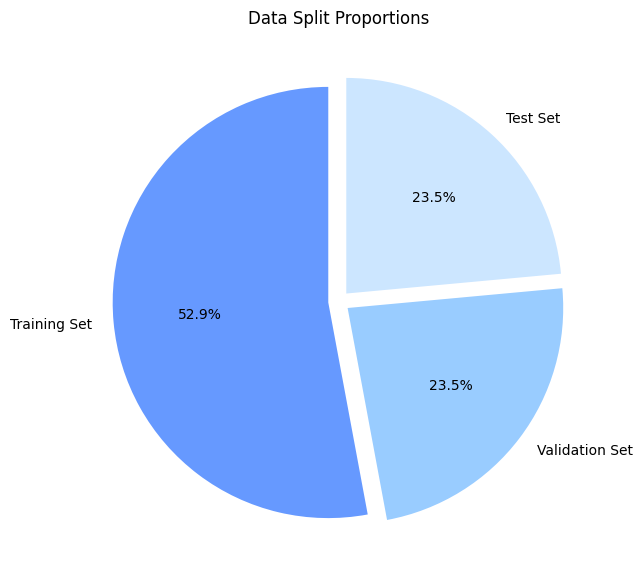

In [12]:
# Assuming test_generator, validation_generator, and train_generator are defined

total_size = len(test_generator) + len(val_generator) + len(train_generator)
test_size = len(test_generator)
val_size = len(val_generator)
train_size = len(train_generator)

test_percent = test_size / total_size * 100
val_percent = val_size / total_size * 100
train_percent = train_size / total_size * 100

sizes = [train_percent, val_percent, test_percent]
labels = ['Training Set', 'Validation Set', 'Test Set']

# Define a color scheme (shades of blue as per your preference)
colors = ['#6699ff', '#99ccff', '#cce6ff']

# Plot the pie chart
plt.figure(figsize=(7, 7))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors, explode=(0.05, 0.05, 0.05))
plt.title('Data Split Proportions')
plt.show()


# build the model 
## the mode base on the vgg16 

In [24]:
base_model = keras.applications.VGG16(include_top=False, input_shape=(82, 82, 3))  # Use (84, 84, 3) for RGB images
base_model.trainable = False
class_num = 7
model = keras.models.Sequential()
model.add(keras.layers.Conv2D(filters=32, kernel_size=(3,3), activation=tf.nn.relu, input_shape=(82,82,3)))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.MaxPool2D((2,2)))  
model.add(keras.layers.Conv2D(filters=64, kernel_size=(3,3), activation=tf.nn.relu)) 
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.MaxPool2D((2,2))) 
model.add(keras.layers.Dropout(.3)) 
model.add(keras.layers.Conv2D(filters=128, kernel_size=(3,3), activation=tf.nn.relu))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.MaxPool2D((2,2))) 
model.add(keras.layers.Dropout(.3)) 
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(class_num, activation=tf.nn.softmax))

In [25]:
from keras.optimizers import Adam

# Instantiate the Adam optimizer with the desired learning rate
optimizer = Adam(learning_rate=0.001)

# Compile the model using the optimizer instance without calling it
model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Print the model summary
model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 80, 80, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 80, 80, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 40, 40, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 38, 38, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 38, 38, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 19, 19, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 19, 19, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 17, 17, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 17, 17, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 7)              │        57,351 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 151,495 (591.78 KB)

 Trainable params: 151,047 (590.03 KB)

 Non-trainable params: 448 (1.75 KB)

In [26]:
from keras.callbacks import EarlyStopping

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss',  # Monitor validation loss
                               patience=3,          # Number of epochs with no improvement after which training will be stopped
                               restore_best_weights=True)

In [27]:
hist = model.fit(
    train_generator,
    epochs=120,
    batch_size=128,
    validation_data=val_generator, 
    callbacks=[early_stopping]  
)


Epoch 1/120
985/985 ━━━━━━━━━━━━━━━━━━━━ 79s 79ms/step - accuracy: 0.2253 - loss: 2.9898 - val_accuracy: 0.2411 - val_loss: 2.0618
Epoch 2/120
985/985 ━━━━━━━━━━━━━━━━━━━━ 166s 169ms/step - accuracy: 0.3261 - loss: 1.7889 - val_accuracy: 0.3106 - val_loss: 1.7904
Epoch 3/120
985/985 ━━━━━━━━━━━━━━━━━━━━ 173s 176ms/step - accuracy: 0.3827 - loss: 1.6435 - val_accuracy: 0.3272 - val_loss: 1.7528
Epoch 4/120
985/985 ━━━━━━━━━━━━━━━━━━━━ 216s 219ms/step - accuracy: 0.4248 - loss: 1.5542 - val_accuracy: 0.3590 - val_loss: 1.7713
Epoch 5/120
985/985 ━━━━━━━━━━━━━━━━━━━━ 228s 231ms/step - accuracy: 0.4384 - loss: 1.5385 - val_accuracy: 0.3625 - val_loss: 1.7070
Epoch 6/120
985/985 ━━━━━━━━━━━━━━━━━━━━ 244s 247ms/step - accuracy: 0.4689 - loss: 1.4459 - val_accuracy: 0.3835 - val_loss: 1.6358
Epoch 7/120
985/985 ━━━━━━━━━━━━━━━━━━━━ 242s 246ms/step - accuracy: 0.4862 - loss: 1.4117 - val_accuracy: 0.3856 - val_loss: 1.6521
Epoch 8/120
985/985 ━━━━━━━━━━━━━━━━━━━━ 153s 155ms/step - accuracy: 0.

In [28]:
accuracy = model.evaluate(test_generator)

print('Test Accuracy=',accuracy[1])


438/438 ━━━━━━━━━━━━━━━━━━━━ 70s 160ms/step - accuracy: 0.4234 - loss: 1.5532
Test Accuracy= 0.4324285686016083


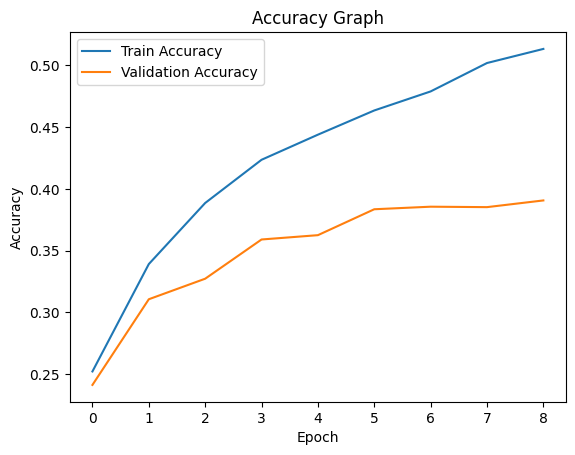

In [29]:
plt.plot(hist.history['accuracy'], label='Train Accuracy')
plt.plot(hist.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy Graph')
plt.show()

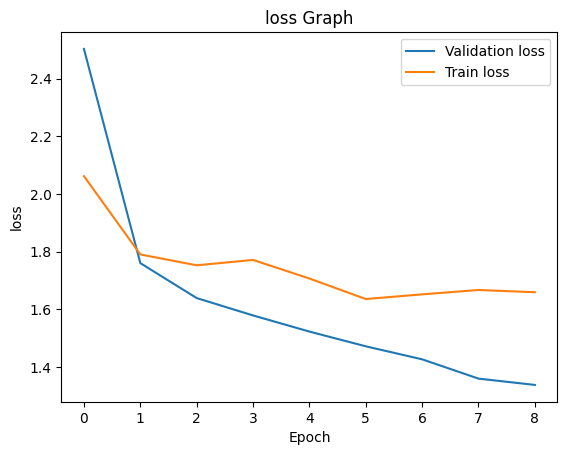

In [30]:
plt.plot(hist.history['loss'], label='Validation loss')
plt.plot(hist.history['val_loss'], label='Train loss')
plt.xlabel('Epoch')
plt.ylabel('loss')
plt.legend()
plt.title('loss Graph')
plt.show()

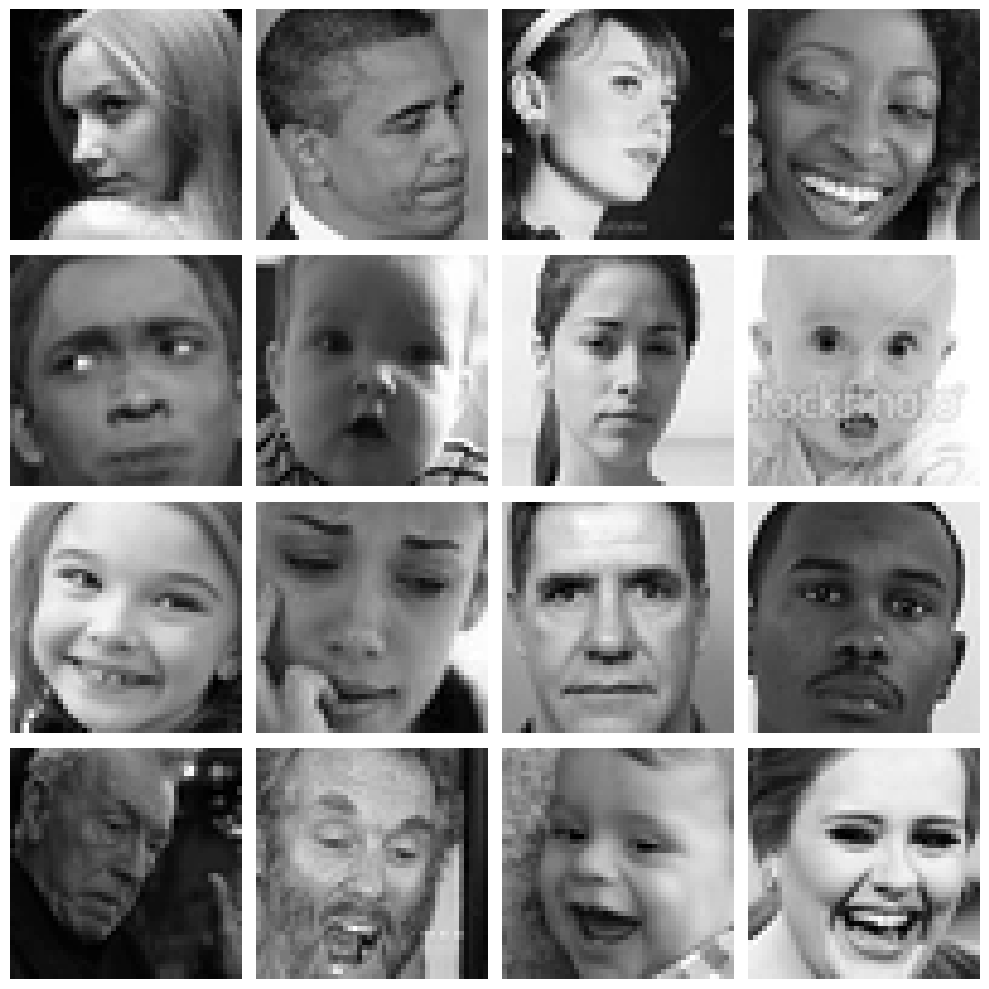

In [18]:
import random
import os
import matplotlib.pyplot as plt
import cv2

base_folder_path = "D:\\my work\\my work\\CNN\\Emotion Faces"
main_folders = ['train', 'test', 'val']
subfolders = ['angry', 'disgusted', 'fearful', 'happy', 'neutral', 'sad', 'surprised']

def display_sample_images(image_dir, num_images=16):
    # Collect all image file paths
    all_images = []
    for subfolder in subfolders:
        subfolder_path = os.path.join(image_dir, subfolder)
        # Check if subfolder exists and add images to list
        if os.path.exists(subfolder_path):
            all_images.extend([os.path.join(subfolder_path, file) for file in os.listdir(subfolder_path)])

    # Ensure we do not sample more images than available
    num_images = min(num_images, len(all_images))
    sampled_images = random.sample(all_images, num_images)
    
    plt.figure(figsize=(10, 10))
    for i, img_path in enumerate(sampled_images):
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        plt.subplot(4, 4, i + 1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Display 16 random training images
train_dir = os.path.join(base_folder_path, "train")
display_sample_images(train_dir)


# the test

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


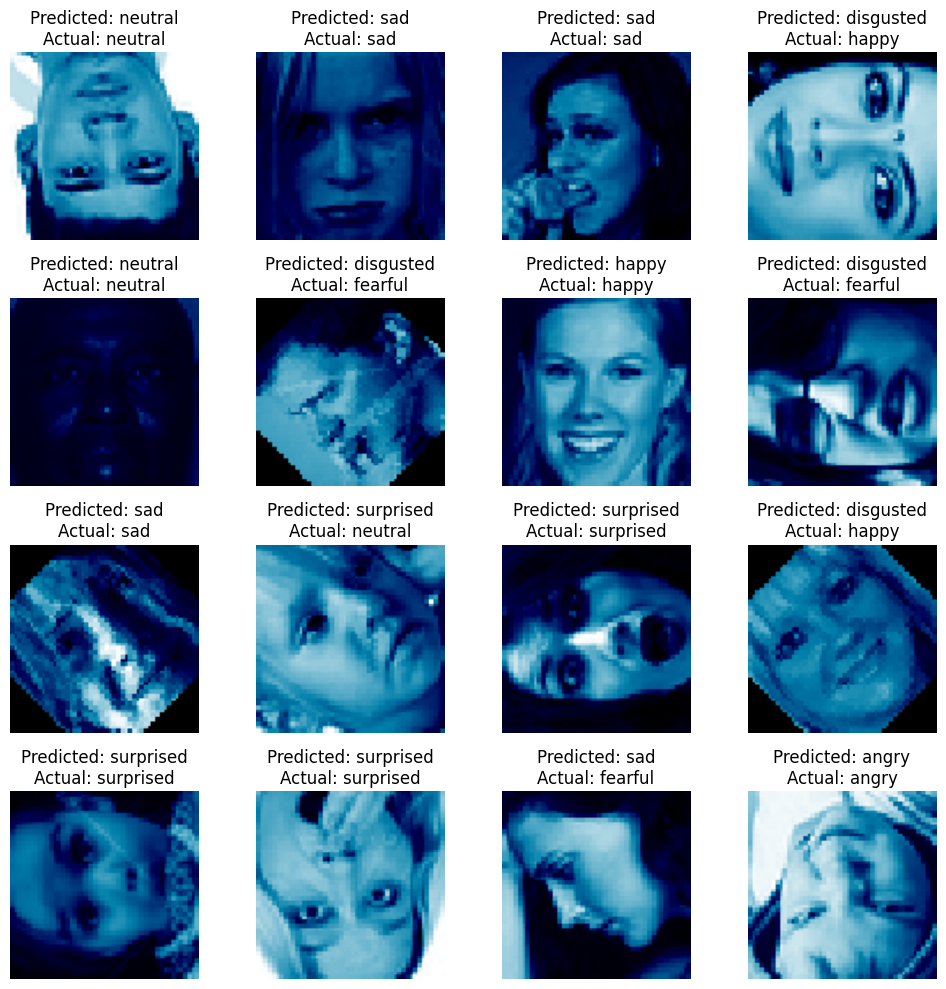

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Mapping from numerical labels to emotion categories
label_map = {
    0: 'angry',
    1: 'disgusted',
    2: 'fearful',
    3: 'happy',
    4: 'neutral',
    5: 'sad',
    6: 'surprised'
}

# Get the first batch of test data from test_generator
X_test, y_test = test_generator.__getitem__(0)  # Use index 0 to get the first batch

# Get the predicted labels for the test set and map them to emotion categories
predicted_labels = np.argmax(model.predict(X_test), axis=1)
predicted_chars = [label_map[label] for label in predicted_labels]

# Map the actual test labels (from y_test) to emotion categories
# y_test is likely one-hot encoded, so we take argmax to get the label index
actual_chars = [label_map[np.argmax(label)] for label in y_test]  # Assuming y_test is one-hot encoded

# Plot some of the test images with their predicted and actual character labels
plt.figure(figsize=(10, 10))
for i in range(16):  # Display the first 16 test images
    plt.subplot(4, 4, i + 1)
    plt.imshow(X_test[i])  # Display the image (assuming the generator provides the correct format)
    
    # Display predicted and actual character labels
    plt.title(f'Predicted: {predicted_chars[i]}\nActual: {actual_chars[i]}')
    plt.axis('off')

plt.tight_layout()
plt.show()


In [36]:
model.save("cnn_92.h5")

# new sample

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
['disgusted']


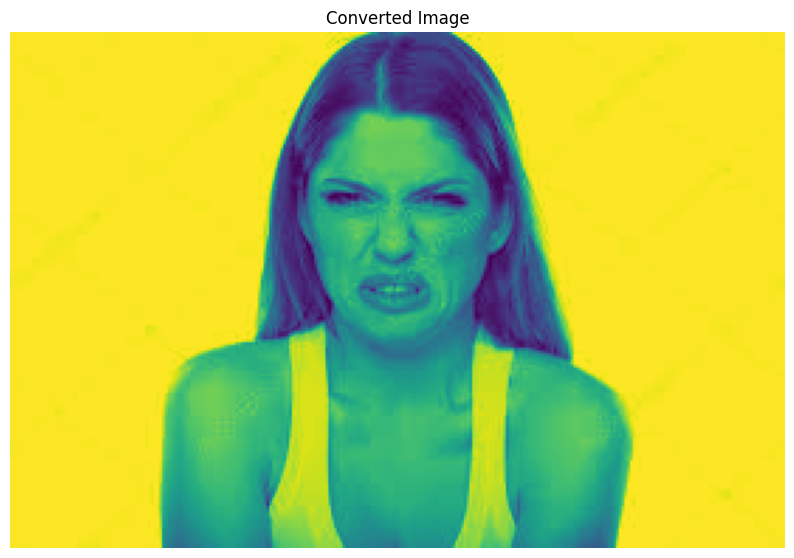

In [54]:
import cv2
import numpy as np

new = 'disgusted.jpg'

# Label mapping
label_map = {
    0: 'angry',
    1: 'disgusted',
    2: 'fearful',
    3: 'happy',
    4: 'neutral',
    5: 'sad',
    6: 'surprised'
}

# Function to convert grayscale image to RGB using a colormap
def grayscale_to_rgb(img):
    return cv2.applyColorMap(img, cv2.COLORMAP_SPRING)

# Load image and convert to RGB
img = cv2.imread(new, cv2.IMREAD_GRAYSCALE)
if img is not None:
    img_rgb = grayscale_to_rgb(img)

    # Resize the image to desired size (82x82)
    img_resized = cv2.resize(img_rgb, (82, 82))
    
    # Prepare image for model prediction
    img_resized = img_resized.astype('float32') / 255.0  # Normalize
    img_resized = np.expand_dims(img_resized, axis=0)  # Add batch dimension

    # Predict the label
    predicted_labels = np.argmax(model.predict(img_resized), axis=1)
    predicted_chars = [label_map[label] for label in predicted_labels]

    print(predicted_chars)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.title("Converted Image")
    plt.axis('off')  # Hide axes
    plt.show()
else:
    print("Error: Image not loaded.")


# this is not the final result and on the future will be updated